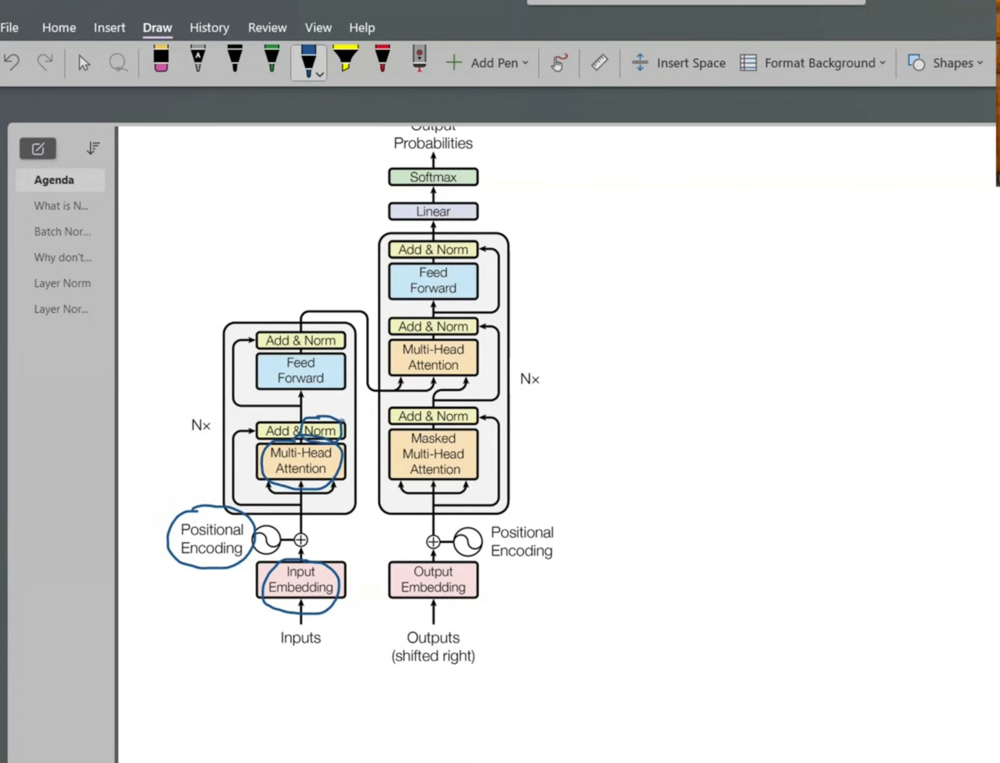



---

## Topic 1: What is Normalization in Deep Learning?

### 1. Introduction
**Normalization** is a process of transforming data to have specific statistics. In deep learning, it is a crucial technique used to keep input data and internal activations within a controlled range. This helps make the training of neural networks more stable and faster. Think of it like standardizing ingredients in a recipe—if everything is measured in the same units, the cooking (training) process is much smoother and predictable.

### 2. Detailed Explanation
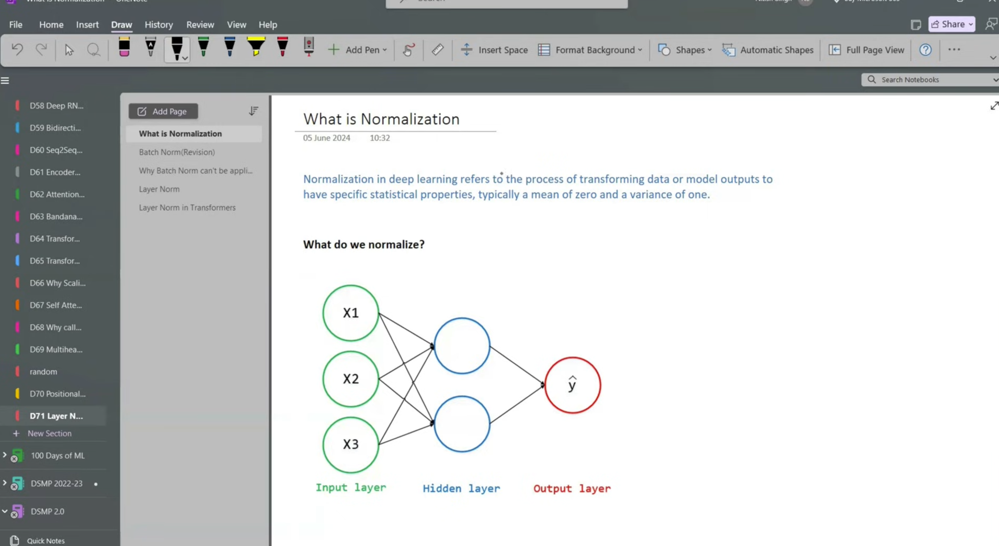
In deep learning, you can normalize two main things:
1.  **The Input Data:** This is the data you feed into the network (e.g., features like `f1`, `f2`, `f3`). You might use techniques like standardization or min-max scaling to bring the data into a given range.
2.  **The Activations of Hidden Layers:** This is the output of the neurons inside the network. Normalizing these internal values is where techniques like Batch Normalization and Layer Normalization come into play.

**Why is normalization useful?** It provides four key benefits:
- **Improves Training Stability:** It reduces the likelihood of extreme values that can cause gradients to explode. If weights become very large, activations become large, and the model will struggle to converge.
- **Faster Convergence:** By keeping gradients at a consistent magnitude, the model can learn and converge more quickly.
- **Reduces Internal Covariate Shift:** This is a major problem where the distribution of inputs to internal layers changes over time as the network's weights are updated. It's like trying to hit a moving target.
    - **Covariate Shift:** The distribution of input data changes between training and prediction. (e.g., training a flower classifier only on red roses, but predicting on yellow roses).
    - **Internal Covariate Shift:** The distribution of *activations* within a network changes over time during training. Because the weights change via backpropagation, the outputs of previous layers (which are the inputs to the next layer) also change. Normalization helps stabilize this.
- **Regularization Effect:** Some forms of normalization also provide a slight regularization effect, which can help prevent overfitting.

### 3. Key Points
- Normalization transforms data to have specific statistics (e.g., mean of 0, standard deviation of 1).
- It is applied either to the **input data** or the **activations of hidden layers**.
- Its main benefits are: stable training, faster convergence, solving internal covariate shift, and a regularization effect.

### 4. Common Mistakes
- **Confusing Normalization with Standardization:** Beginners often use the terms interchangeably. While related, they are different techniques.
- **Applying Normalization Only to Inputs:** A common oversight is to normalize only the input data, forgetting to normalize the activations of hidden layers, which is where techniques like Batch Norm and Layer Norm are crucial.
- **Thinking it's Only for Data Preprocessing:** Many forget that normalization is not just a pre-processing step but a technique applied during training (inside the architecture) to manage internal activations.

### 5. Interview/Exam Questions
**Q: What is normalization in deep learning and why is it useful?**
**A:** Normalization in deep learning refers to transforming data, or the activations of hidden layers, to have specific statistics like a mean of zero and a standard deviation of one. It is useful because it improves training stability, accelerates convergence by preventing extreme values that cause exploding gradients, helps mitigate the problem of internal covariate shift, and can offer a regularization effect.

**Q: In deep learning, where is normalization applied?**
**A:** Normalization can be applied in two places: on the **input data** itself (as a preprocessing step) and on the **activations of hidden layers** within the neural network.

### 6. Revision Notes
- Normalization = transforming data/activations to controlled statistics (like zero mean, unit variance).
- Applied to: **Inputs** and **Hidden Layer Activations**.
- 4 Benefits: **Stability**, **Speed**, **Fixes Internal Covariate Shift**, **Regularization**.
- Internal Covariate Shift = the distribution of internal layer inputs changes over time because of updated weights.

---



## Topic 2: Batch Normalization – A Quick Revision

### 1. Introduction
**Batch Normalization (Batch Norm)** is a technique used to normalize the activations of hidden layers across a **batch** of data. It is the most common normalization technique in traditional deep learning. The core idea is to stabilize the learning process by reducing internal covariate shift. In this method, normalization is performed *across* the batch dimension for each feature (column) independently.

---

### 2. Detailed Explanation
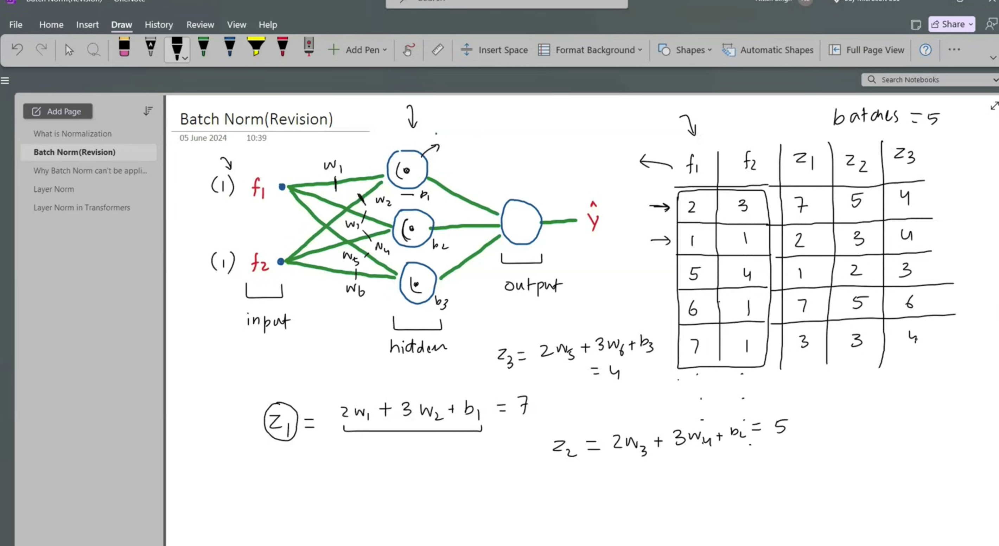
To understand Batch Norm, let's walk through the process step-by-step using a practical example.

**The Setup:**
- We have a dataset with two features: `f1` and `f2`. Many rows exist in this dataset.
- We have a simple neural network with one hidden layer (containing 3 nodes).
- We will train this network in **batches**. For this example, the **batch size = 5**, meaning we process the first 5 rows of data at once.
- For each node in the hidden layer, we calculate a weighted sum (pre-activation). Let's call these `z1`, `z2`, and `z3` for the three nodes.

**Step-by-Step Process:**

1.  **Forward Pass for a Batch:**
    - We send the first 5 rows into the network. For each row, the network calculates the weighted sum for each node.
    - For example:
        - For the first row (`f1=2, f2=3`): `z1`, `z2`, and `z3` are calculated.
        - This is done for all 5 rows, giving us a matrix of values: 5 rows × 3 columns (`z1`, `z2`, `z3`).
        - Let's say the values are:
            - `z1`: `[7, 1, 3, 2, 5]`
            - `z2`: `[5, 2, 7, 4, 3]`
            - `z3`: `[4, 3, 1, 6, 6]`

2.  **Calculating Statistics (Across Batch):**
    - For Batch Norm, we normalize **across the batch**.
    - This means for **each feature (column)**, we calculate the mean and standard deviation using all the values in that batch.
    - For `z1`:
        - `μ1` = mean of `[7, 1, 3, 2, 5]`
        - `σ1` = standard deviation of `[7, 1, 3, 2, 5]`
    - Similarly, we calculate `μ2`, `σ2` for `z2`, and `μ3`, `σ3` for `z3`.

3.  **Normalization:**
    - For each value in the batch, we subtract its column's mean and divide by its column's standard deviation.
    - For example, to normalize the first value of `z1` (`7`):
        - `7 - μ1 / σ1` = `7.36` (example value).
    - This is done for *every* value in the batch.

4.  **Scaling & Shifting:**
    - In Batch Norm, we don't just stop at standardization. We introduce two **learnable parameters** for each node:
        - **Gamma (γ):** A scaling parameter.
        - **Beta (β):** A shifting parameter.
    - The normalized value is then multiplied by `γ` and added to `β`.
    - For example, for `z1`'s normalized value (7.36), we do `(7.36 * γ1) + β1`. Initially, `γ1 = 1` and `β1 = 0`, but they will change during training.
    - This final value replaces the original `z1` value.
    - This process is repeated for all `z2` and `z3` values.

5.  **Continuing the Process:**
    - Once all `z1`, `z2`, and `z3` values are normalized, they are passed to the activation function, which then produces the final output of the hidden layer for that batch.

---

### 3. Key Points
- Batch Norm normalizes **across the batch dimension** (for each feature/column).
- It calculates the mean and standard deviation for a *single feature* using *all rows* in that batch.
- It includes two learnable parameters, **Gamma (γ)** and **Beta (β)**, for scaling and shifting, giving the network flexibility.
- It is effective but has limitations when dealing with sequential data.

---

### 4. Common Mistakes
- **Misunderstanding the Direction:** A common mistake is to think Batch Norm normalizes across the features. Remember, it normalizes *across the batch* (e.g., vertically down the rows).
- **Forgetting the Scaling/Shifting:** Beginners often think Batch Norm only standardizes the data. They forget that the `γ` and `β` parameters are crucial as they allow the network to learn the optimal distribution.
- **Assuming it works for all data types:** Many assume Batch Norm is a universal solution. As we'll see in the next topic, it doesn't work well with sequential data because of padding.

---

### 5. Interview/Exam Questions
**Q: In Batch Normalization, what is the purpose of the Gamma (γ) and Beta (β) parameters?**
**A:** Gamma (γ) and Beta (β) are learnable parameters introduced to give the network the ability to scale and shift the normalized values. Without them, the network might lose representational power if forcing all activations to have a mean of 0 and std of 1 is not optimal. They allow the network to learn the best distribution for its activations.

**Q: Explain the main difference in the direction of normalization between Batch Normalization and Layer Normalization.**
**A:** The key difference lies in the direction of normalization:
- **Batch Normalization** normalizes **across the batch** (i.e., for each feature, across all examples in the batch).
- **Layer Normalization** normalizes **across the features** (i.e., for each example, across all its features).

---

### 6. Revision Notes
- Batch Norm = Normalizes **across batch** (vertical, by column).
- Steps:
    1.  Calculate `μ` (mean) and `σ` (std) for each feature across the batch.
    2.  Normalize: `(value - μ) / σ`
    3.  Scale & Shift: `(normalized * γ) + β`
- `γ` and `β` are learnable parameters, unique to each feature/node.
- Normalization is applied to the pre-activation (`z`) values.

---



## Topic 3: Why Batch Normalization Fails for Sequential Data & Transformers

### 1. Introduction
While Batch Normalization is a powerful technique for standard neural networks, it fails when applied to **sequential data** like sentences in a Transformer. The core problem is that sequences have variable lengths, forcing us to add **padding** (dummy zero values) to make all sequences the same length. Batch Norm calculates statistics (mean and standard deviation) across the batch, and these padded zeros distort those statistics, making them an inaccurate representation of the real data.

### 2. Detailed Explanation
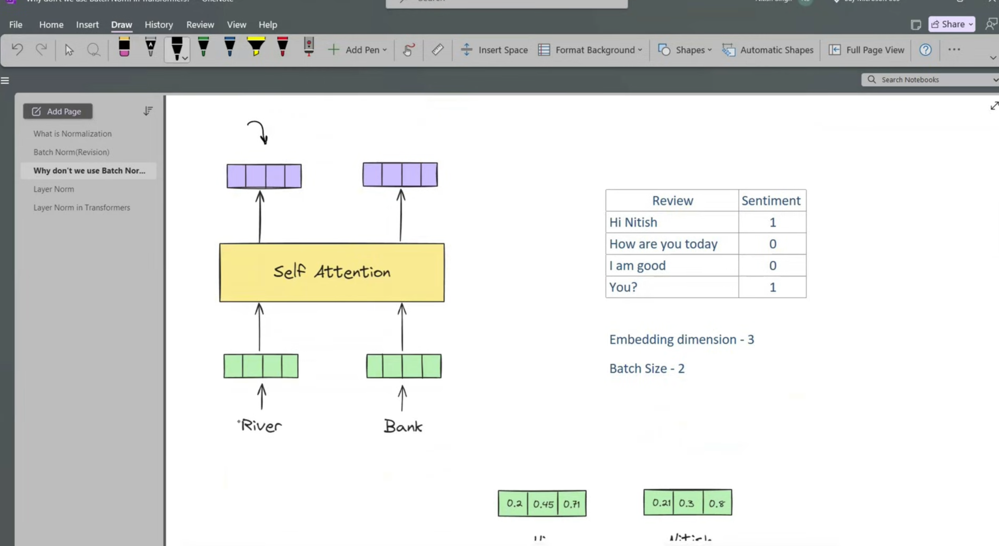
Let's understand this with a step-by-step scenario of training a Self-Attention module for sentiment analysis on a dataset of reviews.

**The Setup:**
- **Task:** Sentiment analysis (e.g., classifying reviews as positive or negative).
- **Data:** We have 4 sentences in our dataset:
    - Sentence 1: "Hi Nitesh" (2 words)
    - Sentence 2: "How are you today?" (4 words)
    - Sentence 3: "I am good" (3 words)
    - Sentence 4: ... (another variable length sentence)
- **Batch Size = 2:** We train by sending two sentences at a time to the Self-Attention module.
- **Embedding Dimension = 4:** Each word is represented by a 4-dimensional vector.

**Step-by-Step Problem Demonstration:**
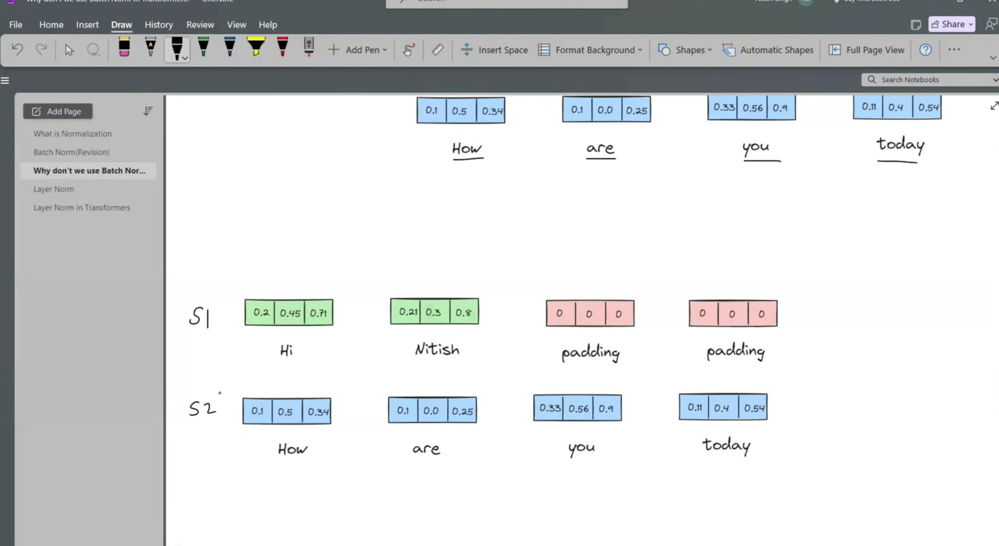
1.  **The First Batch:**
    - Our first batch consists of Sentence 1 ("Hi Nitesh") and Sentence 2 ("How are you today?").
    - After extracting embeddings, the shapes are:
        - Sentence 1: Shape (2 words × 4 dimensions)
        - Sentence 2: Shape (4 words × 4 dimensions)

2.  **The Padding Problem:**
    - The Self-Attention module requires all inputs to have the same shape. Since Sentence 1 has 2 words and Sentence 2 has 4 words, they are incompatible.
    - To fix this, we use **padding**. We add dummy words (with zero embeddings) to the shorter sentence.
    - Now, Sentence 1 becomes: `["Hi", "Nitesh", "PAD", "PAD"]` — Shape (4 words × 4 dimensions).
    - Now both sentences have 4 words each, and we can send them to Self-Attention.

3.  **The Self-Attention Output:**
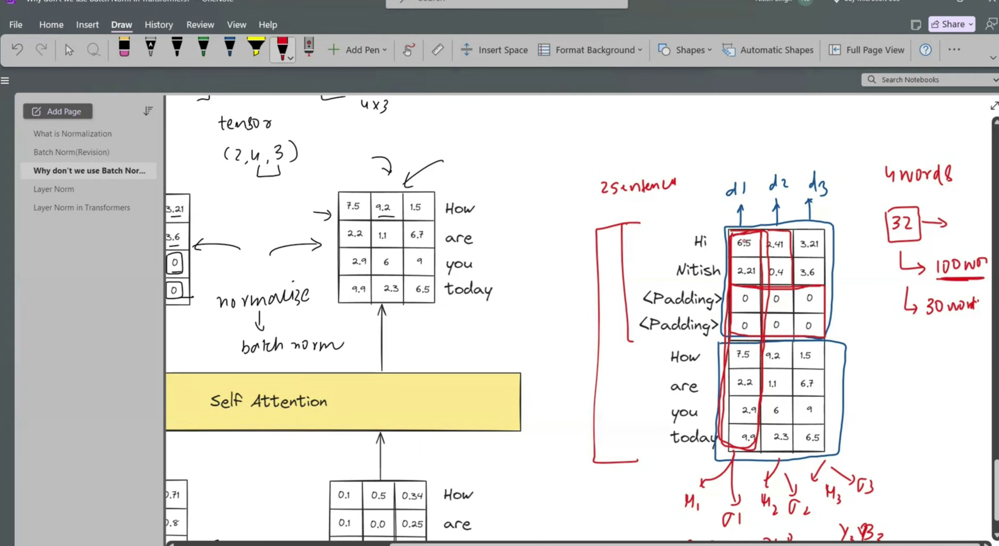
    - The Self-Attention module processes both sentences and generates contextual embeddings.
    - The shape of the output remains (4 words × 4 dimensions) for each sentence.
    - Important: The output for the PAD tokens is **also zero**. This is because any calculation with zero results in zero.
    - So, for Sentence 1, the outputs for "Hi" and "Nitesh" will be non-zero, but the outputs for the two PAD tokens will be zero.

4.  **The Point of Failure (Batch Normalization):**
    - Now we want to apply **Batch Normalization** to the output activations.
    - Remember, Batch Norm works **column-wise**. For a given feature dimension (let's say Dimension 1), it takes all values from all rows across the **entire batch** and computes a mean and standard deviation.
    - Our batch has 2 sentences, each with 4 words. So, for Dimension 1, there are `2 × 4 = 8` values.
    - Out of these 8 values, many will be **zero** because of the PAD tokens from Sentence 1!
    - **The Problem:** The mean and standard deviation calculated for Dimension 1 will be heavily skewed by these large number of artificial zeros. This mean will not be a "true" representation of the data.
    - The same issue occurs for Dimensions 2, 3, and 4.

**The Real-World Scale:**
Imagine a batch size of 32, where the longest sentence has 100 words, but most sentences are only 30 words long. The majority of the values in your batch will be zero, completely ruining the statistics computed by Batch Norm. The mean will be close to zero, and the standard deviation will be inaccurate.

### 3. Key Points
- **Sequential data has variable lengths,** which forces the use of **padding** to create uniform tensors.
- **Batch Normalization normalizes across the batch** (column-wise). This means its statistics are influenced by all values, including the artificial padded zeros.
- Padded zeros are not part of the real data and skew the mean and standard deviation, making them inaccurate representations.
- This problem is not limited to Transformers; it applies to **all sequential data**.

### 4. Common Mistakes
- **Overlooking Padded Zeros:** Beginners often assume Batch Norm will work just because it's a standard technique. They forget that the presence of padded zeros will completely skew the batch statistics.
- **Thinking the Model Ignores Pads:** While the Self-Attention mechanism may not attend to pads, the normalization layer *does* see them. The zeros are not ignored; they are actively used to calculate the mean and standard deviation.
- **Confusing the Problem with the Model's Output:** It's not that the model fails to handle pads; it's that the *normalization* technique is broken by the presence of pads.

### 5. Interview/Exam Questions
**Q: Why is Batch Normalization not suitable for the Transformer architecture?**
**A:** Batch Normalization is not suitable for Transformers because it normalizes across the batch dimension. Since Transformers process variable-length sequences, we must use padding tokens to create batches of uniform size. The padded zeros will be included in the calculation of the mean and standard deviation for each feature. This artificially skews the statistics, resulting in inaccurate normalization and degrading the training process.

**Q: What is the fundamental problem with applying Batch Normalization to any sequential data?**
**A:** The fundamental problem is the **padded zeros**. Sequential data has variable lengths, and padding is required to form consistent batches. When Batch Normalization computes statistics across the batch, these artificial zeros dominate the calculations, leading to a mean and standard deviation that are not representative of the actual data.

### 6. Revision Notes
- Batch Norm works well for fixed-size data (e.g., images).
- It fails for **sequential data** because of **variable lengths**.
- To make sequences the same length, we use **padding (zeros)**.
- Batch Norm's statistics (mean/std) become **corrupted** by these artificial zeros.
- The reason: **Batch Norm = Normalizes across batch**, so it includes all the padded zeros.

---



## Topic 4: Layer Normalization – Explanation and Comparison

### 1. Introduction
**Layer Normalization (Layer Norm)** is the solution to the problem posed by Batch Normalization in sequential data. Instead of normalizing across the batch, Layer Normalization normalizes **across the features** for each individual data point (or token) independently. Because it operates on a single sample, it is completely unaffected by padded zeros from other sequences in the batch. This makes it the preferred normalization technique for Transformers and other recurrent/sequential architectures.

### 2. Detailed Explanation
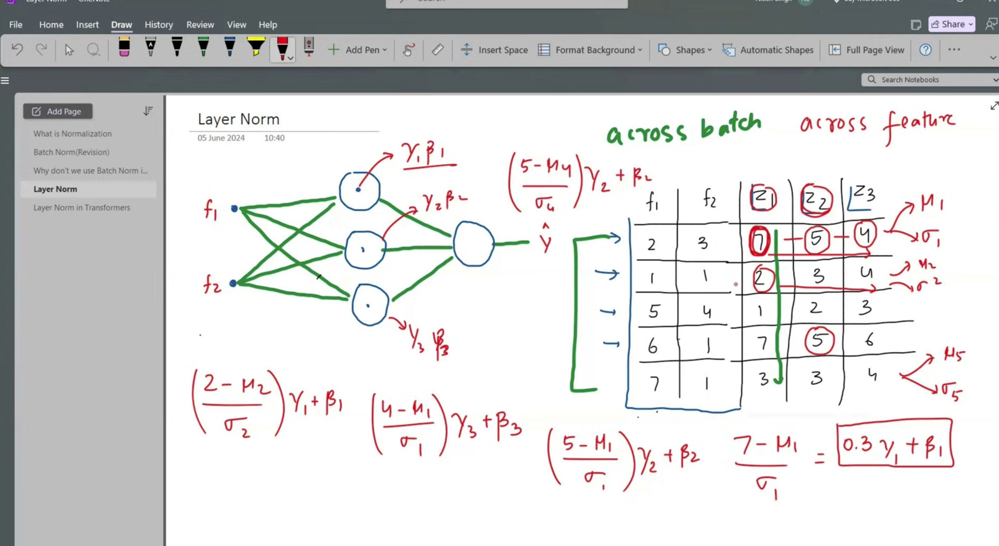
Let's understand how Layer Normalization works using the same setup as Batch Normalization, and then we'll see why it solves the padding problem.

**The Setup (Same as Batch Norm Revision):**
- We have a dataset with 5 rows and 3 features (the pre-activations `z1`, `z2`, and `z3` from the hidden layer).
- The data (for 5 rows) is:
    - Row 1: `[7, 5, 4]`
    - Row 2: `[1, 2, 3]`
    - Row 3: `[3, 7, 1]`
    - Row 4: `[2, 4, 6]`
    - Row 5: `[5, 3, 6]`
- Each node (`z1`, `z2`, `z3`) will have its own learnable parameters: **Gamma (γ)** and **Beta (β)**.

**Step-by-Step Process (Layer Normalization):**

1.  **Normalizing Direction (The Big Difference):**
    - In Batch Norm, we calculated statistics *column-wise* (e.g., mean of all `z1` values).
    - In **Layer Norm**, we calculate statistics **row-wise**. For each individual row (each data point), we calculate the mean and standard deviation using *all its features*.

2.  **Calculating Statistics (Across Features):**
    - For **Row 1** (`[7, 5, 4]`):
        - `μ₁` = mean of `[7, 5, 4]` = `(7+5+4)/3 = 5.33`
        - `σ₁` = standard deviation of `[7, 5, 4]`
    - For **Row 2** (`[1, 2, 3]`):
        - `μ₂` = mean of `[1, 2, 3]` = `2`
        - `σ₂` = standard deviation of `[1, 2, 3]`
    - This is repeated for all rows. Each row gets its own unique `μ` and `σ`.

3.  **Normalization:**
    - For each value in the row, we subtract the row's mean and divide by the row's standard deviation.
    - For example, to normalize the first value of Row 1 (`7`):
        - `(7 - μ₁) / σ₁`
    - To normalize the second value of Row 1 (`5`):
        - `(5 - μ₁) / σ₁`
    - This is done for all values in all rows.

4.  **Scaling & Shifting (The Learnable Parameters):**
    - Similar to Batch Norm, Layer Norm also uses Gamma (γ) and Beta (β) for scaling and shifting.
    - **Crucially:** These parameters are **per feature**, not per sample.
        - `γ₁` and `β₁` are for the first feature (`z1`).
        - `γ₂` and `β₂` are for the second feature (`z2`).
        - `γ₃` and `β₃` are for the third feature (`z3`).
    - To get the final normalized value:
        - For Row 1, `z1` value: `(normalized_z1 * γ₁) + β₁`
        - For Row 1, `z2` value: `(normalized_z2 * γ₂) + β₂`
        - For Row 1, `z3` value: `(normalized_z3 * γ₃) + β₃`

**Why This Solves the Padding Problem:**

Let's bring back our Transformer example. We have a batch with two sentences: one of length 4, and one with padding.

- **Batch Norm's Problem:** For a single feature dimension, it looked at *all 8 values* (from both sentences) to calculate the mean. The padded zeros from the shorter sentence heavily influenced the mean.
- **Layer Norm's Solution:** Layer Norm processes each token (word) **independently**. For a given token (word), it looks at its own 4-dimensional embedding vector and calculates the mean and standard deviation. The padded zeros are irrelevant because they belong to a *different token* (from a different sentence) and are never included in the calculation for this token.
- Even when a padded token is normalized, it only affects itself: `(0 - μ_for_this_row) / σ_for_this_row * γ + β = 0`. The zeros do not "leak" and corrupt the statistics of other tokens.

### 3. Key Points
- Layer Normalization normalizes **across the features** (row-wise).
- It calculates the mean and standard deviation for each *single* data point (word/token) independently.
- It uses learnable parameters **Gamma (γ)** and **Beta (β)** for *each feature dimension*.
- It is **not affected by padding**, making it ideal for sequential data and Transformers.

### 4. Comparison Table: Batch Norm vs. Layer Norm

| Feature | Batch Normalization | Layer Normalization |
| :--- | :--- | :--- |
| **Normalization Direction** | **Across the batch** (column-wise) | **Across the features** (row-wise) |
| **Statistics Calculated Over** | Each feature (column) using all rows in the batch. | Each sample (row) using all its features. |
| **Learnable Parameters (γ, β)** | Per feature (same for all rows). | Per feature (same for all rows). |
| **Impact of Padding** | **Heavily Affected:** Padded zeros skew the statistics. | **Unaffected:** Each sample is normalized independently. |
| **Best Used For** | Traditional neural networks with fixed-size inputs (e.g., images). | Sequential data, Transformers, NLP models. |

### 5. Common Mistakes
- **Confusing the Direction:** The most common mistake is mixing up the direction of normalization. Remember: Batch Norm = **across the batch**; Layer Norm = **across the features**.
- **Thinking γ and β are per sample:** A common error is to assume that each sample has its own unique Gamma and Beta. They are learnable parameters that are shared across all samples for a given feature.
- **Assuming Layer Norm is Just Batch Norm but Row-wise:** While the core idea (standardize then scale/shift) is similar, the direction changes everything. This small shift in perspective is what makes it work for sequences.

### 6. Interview/Exam Questions
**Q: Explain the fundamental difference between Batch Normalization and Layer Normalization.**
**A:** The fundamental difference is the direction of normalization. Batch Normalization normalizes across the batch dimension (i.e., for each feature, using statistics from all examples in the batch). Layer Normalization normalizes across the feature dimension (i.e., for each example, using statistics from all its features).

**Q: Why is Layer Normalization preferred over Batch Normalization in the Transformer architecture?**
**A:** Layer Normalization is preferred because Transformers process sequences of variable length. To batch these sequences, we must add padding tokens. Batch Normalization's statistics are calculated across the batch, so these padded zeros would skew the mean and standard deviation, leading to inaccurate normalization. Layer Normalization, however, normalizes each token independently by calculating statistics across its features, thus it is completely unaffected by padding.

### 7. Revision Notes
- Layer Norm = Normalizes **across features** (horizontal, row-wise).
- Steps:
    1.  Calculate `μ` (mean) and `σ` (std) for each **row** across its features.
    2.  Normalize: `(value - μ(row)) / σ(row)`
    3.  Scale & Shift: `(normalized * γ_feature) + β_feature`
- `γ` and `β` are learnable parameters, **unique to each feature**.
- It works because it is **independent of padding**. Pad tokens are normalized in isolation and do not affect other tokens.

---



## Topic 5: Layer Normalization in the Transformer Architecture – Practical Demonstration

### 1. Introduction
Now that we understand why Layer Normalization is needed, let's see exactly how it is applied within the Transformer's Self-Attention mechanism. This demonstration will tie everything together, showing how Layer Norm processes the output of Self-Attention on a batch of sentences and why it successfully handles padding.

### 2. Detailed Explanation
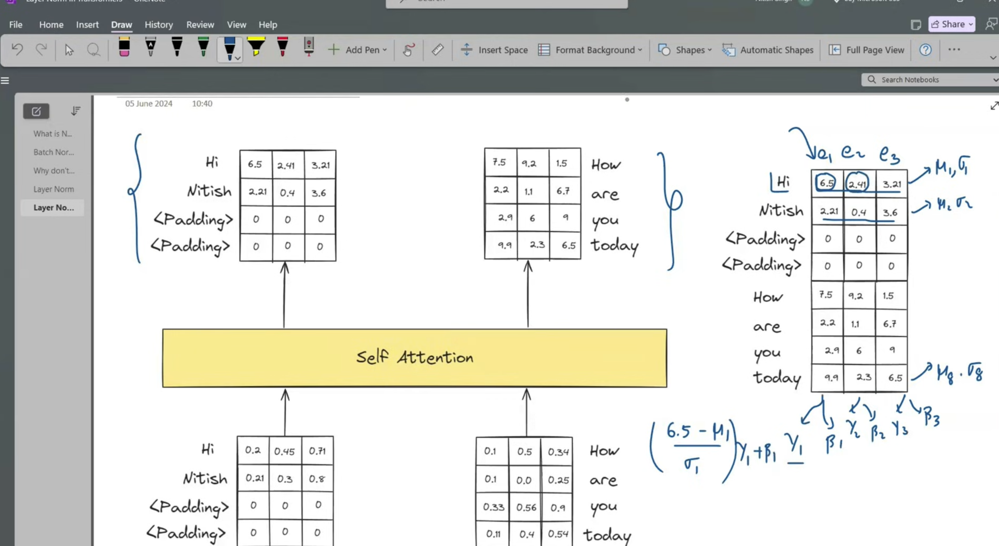
Let's revisit our sentiment analysis example. We have a batch of two sentences that have been processed by the Self-Attention module.

**The Setup:**
- **Batch Size = 2:** Two sentences are being processed simultaneously.
- **Sentence 1:** "Hi Nitesh" (padded to length 4) → `["Hi", "Nitesh", "PAD", "PAD"]`
- **Sentence 2:** "How are you today?" (length 4) → `["How", "are", "you", "today?"]`
- **Embedding Dimension = 3:** For simplicity, each word is represented by a 3-dimensional vector (the transcript uses 4, but 3 is fine for the demonstration).

**Step-by-Step Process:**

**1. Input Embeddings:**
- Each word in both sentences has an embedding vector of size 3.
- After passing through Self-Attention, we get **contextual embeddings** for each word. The shape of the output is still `(words × 3)` for each sentence.

**2. The Output from Self-Attention:**
- Let's look at the contextual embeddings for our two sentences. The values are arbitrary numbers for demonstration.

    **Sentence 1 (with PADs):**
    - Word 1 ("Hi"): `[6.5, 2.4, -1.2]`
    - Word 2 ("Nitesh"): `[8.1, 3.0, -0.5]`
    - Word 3 ("PAD"): `[0.0, 0.0, 0.0]`
    - Word 4 ("PAD"): `[0.0, 0.0, 0.0]`

    **Sentence 2 (No PADs):**
    - Word 1 ("How"): `[1.2, 0.8, -0.3]`
    - Word 2 ("are"): `[2.5, 1.1, 0.2]`
    - Word 3 ("you"): `[3.0, 1.5, 0.5]`
    - Word 4 ("today?"): `[0.9, 0.6, -0.1]`

**3. Applying Layer Normalization:**

Remember, Layer Normalization works **per token (row-wise)**. For each word in each sentence, we independently calculate the mean and standard deviation of its *three* embedding dimensions.

- **For Word 1 of Sentence 1 ("Hi"):**
    - Values: `[6.5, 2.4, -1.2]`
    - `μ` = `(6.5 + 2.4 - 1.2) / 3 = 7.7 / 3 = 2.56`
    - `σ` = Standard deviation of `[6.5, 2.4, -1.2]`
    - Now, each value is normalized:
        - Dimension 1: `(6.5 - 2.56) / σ`
        - Dimension 2: `(2.4 - 2.56) / σ`
        - Dimension 3: `(-1.2 - 2.56) / σ`
    - These normalized values are then scaled and shifted using `γ₁`, `β₁` for Dimension 1, `γ₂`, `β₂` for Dimension 2, and `γ₃`, `β₃` for Dimension 3.

- **For Word 3 of Sentence 1 ("PAD"):**
    - Values: `[0.0, 0.0, 0.0]`
    - `μ` = `0`
    - `σ` = `0` (but we handle division by zero with a small epsilon)
    - Normalized values: `(0 - 0) / σ = 0`
    - After scaling and shifting: `(0 * γ₁) + β₁ = β₁`, not zero! Wait, the transcript states the output of a PAD token becomes zero. Let's clarify.

    **Important Clarification (from the transcript):**
    The transcript says: *"This is 0 - μ₄. This will also be the row itself. Sigma 4 will also be 0. Multiply by gamma 1 + b 1 will come out to be 0 only."*
    
    This statement simplifies the math. For a PAD token (all zeros), `μ = 0` and `σ = 0`. In practice, to avoid division by zero, a small constant (epsilon, ε) is added to the denominator: `σ + ε`. However, the transcript suggests that the output of the PAD token remains zero. This implies that either:
    1.  The normalization step zeros out the values (since `(0 - 0) / (0 + ε) = 0`), and then `(0 * γ) + β` is considered to be zero.
    2.  Or, in the specific implementation mentioned, the PAD token's normalized value is simply treated as zero.

    In essence, the PAD token does not affect the statistics of other tokens, and its own value remains zero.

- **For all other words:** The same row-wise process is repeated. For each word, we calculate its own `μ` and `σ` using its three embedding values, normalize, and then scale/shift using the appropriate `γ` and `β`.

**4. Why This Works:**
- The `μ` and `σ` for a real word (like "Hi") are calculated **only** using its own three embedding values.
- The PAD token's `μ` and `σ` are calculated using its own three zeros, but they are **never used** to normalize a real word.
- The zeros "only affect themselves," as the transcript perfectly states. They do not leak into the statistics of other tokens.

### 3. Key Points
- **Layer Normalization processes each token independently.**
- For each token, it calculates the `μ` and `σ` across its embedding dimensions.
- This means that a padded zero token will **only affect its own normalization** and will not skew the statistics of the other real tokens.
- The PAD token's output remains zero after normalization.
- This independence from padding is what makes Layer Normalization the perfect fit for Transformers.

### 4. Common Mistakes
- **Assuming Layer Norm Aggregates Across Tokens:** A common misconception is that Layer Normalization will look at all tokens in a sentence and calculate a single mean for the entire sentence. It does not. It calculates a separate mean for *each* token.
- **Thinking the Normalization is Global:** Some believe Layer Norm normalizes across all words and all features in the entire batch. It operates on a per-token basis, making it very granular.
- **Forgetting the Impact of γ and β:** Just like in Batch Norm, the `γ` and `β` parameters are crucial. Without them, the network's performance could be degraded because the normalized values might be forced into a suboptimal range.

### 5. Interview/Exam Questions
**Q: In the Transformer architecture, how does Layer Normalization handle the padding tokens?**
**A:** Layer Normalization handles padding tokens by normalizing each token independently across its feature dimensions. For a padded token, which is represented by a zero vector, its mean and standard deviation are zero. When normalized and scaled, its output remains zero. More importantly, because the statistics for a real token are calculated using only its own features, the presence of padding tokens does not affect the normalization of the real tokens.

**Q: Walk me through the process of applying Layer Normalization to a single word in a sentence within a Transformer.**
**A:** For a single word, we take its embedding vector (e.g., a 4-dimensional vector `[a, b, c, d]`). We calculate the mean and standard deviation of these four numbers. Then, for each dimension, we standardize the value: `(value - mean) / standard deviation`. Finally, we apply a learnable scale and shift: `(standardized_value * γ_dimension) + β_dimension`. This is done independently for every word in every sentence.

### 6. Revision Notes
- Layer Norm in Transformers = **Per-token normalization across features**.
- For a token with embeddings `[v1, v2, v3, ..., vn]`:
    1. `μ` = mean of `(v1, v2, ..., vn)`
    2. `σ` = std of `(v1, v2, ..., vn)`
    3. `vᵢ_normalized = (vᵢ - μ) / σ`
    4. `output = (vᵢ_normalized * γᵢ) + βᵢ`
- PAD tokens are isolated; they don't corrupt other tokens' statistics.

---


## Topic 6: Summary and Final Recap – Layer Normalization in Transformers

### 1. Introduction
This final topic serves as a comprehensive summary of everything we've covered. Layer Normalization is the last essential component of the Transformer architecture before we dive into the full architecture. To succeed, you need to understand: **what** normalization is, **why** we use it, **how** Batch Norm works, **why** Batch Norm fails for sequences, and finally, **how** Layer Norm solves this problem and fits perfectly into the Transformer.

### 2. Detailed Explanation – The Complete Flow

Let's retrace the entire journey from start to finish, connecting all the concepts.

**1. The Problem: Training Instability**
- Deep neural networks suffer from issues like exploding gradients and internal covariate shift.
- **Internal Covariate Shift:** As the network trains, the weights of earlier layers change. This changes the inputs to later layers, making it difficult for them to learn because they are constantly adapting to a shifting distribution. This is like trying to hit a moving target.

**2. The First Solution: Batch Normalization**
- Batch Norm was introduced to solve this. It normalizes the activations of hidden layers.
- **How?** It looks at a batch of data and normalizes **across the batch**. For a given feature (column), it calculates the mean and standard deviation of all values in that column across all samples in the batch.
- **The Catch:** It works beautifully for fixed-size data (e.g., images), where every sample has the same shape.

**3. The Problem with Transformers (Sequential Data)**
- Transformers process sentences, which have **variable lengths**.
- To create a batch, we must add **padding tokens** to make all sentences the same length.
- **The Failure:** When Batch Norm is applied after Self-Attention, it calculates the mean and standard deviation for a feature using all tokens in the batch. This includes the artificial padded zeros. These zeros dominate the statistics, making the mean and standard deviation inaccurate and corrupting the training process.

**4. The Solution: Layer Normalization**
- Layer Normalization was designed to overcome this limitation. It normalizes **across the features**.
- **How?** For a single token (word), it looks at its embedding vector and calculates the mean and standard deviation across its features.
- **The Success:** This is done **per token**. The statistics for a real token are calculated only from its own values. Padded zeros are normalized in isolation and do not influence the normalization of any other token. This makes Layer Normalization the perfect fit for Transformers.

**5. The Transformer Context (Where We Are)**
- In the Transformer architecture, Layer Normalization is applied **after the Self-Attention mechanism**.
- Here's the simplified flow within a Transformer block:
    1.  Input → Embedding + Positional Encoding
    2.  **Self-Attention** → Generates contextual embeddings
    3.  **Layer Normalization** → Normalizes the output of Self-Attention
    4.  Feed-Forward Network
    5.  **Layer Normalization** → Normalizes the output of the Feed-Forward Network
- This normalization stabilizes the training of the entire Transformer.

### 3. Key Points – The Big Picture
- **Normalization** is essential for stable and fast training in deep learning.
- **Batch Norm** = Normalizes across the batch. Great for fixed-size data, terrible for variable-length sequences.
- **Layer Norm** = Normalizes across the features. Perfect for sequential data because it is **unaffected by padding**.
- In Transformers, Layer Norm is placed **after** key components like Self-Attention and the Feed-Forward Network.
- The learnable parameters **Gamma (γ)** and **Beta (β)** allow the network to learn the optimal scaling and shifting of the normalized values.

### 4. Core Comparisons – The Final Table

| Aspect | Batch Normalization | Layer Normalization |
| :--- | :--- | :--- |
| **Direction of Normalization** | **Across Batch** (Column-wise) | **Across Features** (Row-wise) |
| **Statistics Calculated Over** | All examples in a batch, per feature. | A single example (token), per feature. |
| **Impact of Padding** | **Corrupts statistics** due to zeros. | **No impact** – each token is independent. |
| **Applicability** | Fixed-size data (Images, tabular data). | Sequential data (Text, Time Series). |
| **Use in Transformers** | ❌ Not used. | ✅ **The standard.** |

### 5. Common Mistakes – A Final Warning
- **Confusing the Direction:** This is the number one mistake. Always remember: Batch = Across Batch; Layer = Across Features.
- **Thinking Layer Norm Solves All Problems:** Layer Norm is great for sequences, but it doesn't replace the need for other techniques like residual connections or careful initialization.
- **Forgetting that γ and β are Learnable:** These parameters are not static; they are updated during backpropagation. This gives the network the flexibility to "undo" the normalization if it hurts performance.
- **Believing PAD Tokens are Ignored Entirely:** They are not ignored; they are processed. However, they are processed in isolation, so they don't harm other tokens. Their output remains zero.

### 6. Interview/Exam Questions – The Ultimate Test
**Q: You are designing a Transformer from scratch. Why would you choose Layer Normalization over Batch Normalization?**
**A:** I would choose Layer Normalization because Transformers process variable-length sequences, which require padding to form batches. Batch Normalization normalizes across the batch, so the padded zeros would skew the mean and standard deviation of the features, leading to inaccurate statistics. Layer Normalization, however, normalizes each token independently across its features, making it completely unaffected by padding.

**Q: What are the learnable parameters in Layer Normalization and what is their purpose?**
**A:** The learnable parameters are **Gamma (γ)** and **Beta (β)**. After the values are standardized to have a mean of 0 and a standard deviation of 1, the network multiplies the result by `γ` and adds `β`. This allows the network to learn the optimal scale and shift for the activations, as the normalized distribution might not be the most effective one for the task.

**Q: Explain the concept of Internal Covariate Shift and how normalization helps.**
**A:** Internal Covariate Shift is the problem where the distribution of inputs to a hidden layer changes during training as the weights of previous layers are updated. This makes it harder for the layer to learn because it has to constantly adapt to a changing distribution. Normalization addresses this by stabilizing the distribution of these inputs, making the training process more stable and faster.

### 7. Revision Notes – The Final Cheat Sheet
- **Normalization:** Transform data/activations for stable training.
- **Batch Norm:** Normalizes across batch. Fail for sequences → **Padding zeros corrupt stats.**
- **Layer Norm:** Normalizes across features. Success for sequences → **Padding is isolated.**
- **Transformer Placement:** After Self-Attention and after Feed-Forward Network.
- **Key Formula (Conceptual):** `output = ((value - μ(row)) / σ(row)) * γ(feature) + β(feature)`
- **You are now ready for the full Transformer architecture!**

---

**You have now completed all topics from the transcript. The study notes are complete.**

